<a href="https://colab.research.google.com/github/loaydatrain/ML-Resources/blob/master/Loay_Assignment_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>
<center>
DIP ASSIGNMENT-1 <br>
LOAY RASHID
2018102008
</center>
</h1>

In [2]:
import cv2
import numpy as np 
import plotly.express as px
import os
from google.colab.patches import cv2_imshow 
import matplotlib.pyplot as plt
%matplotlib inline
import math


<h1>
QUESTION 1
</h1>

Text(0.5, 1.0, '1.1.b')

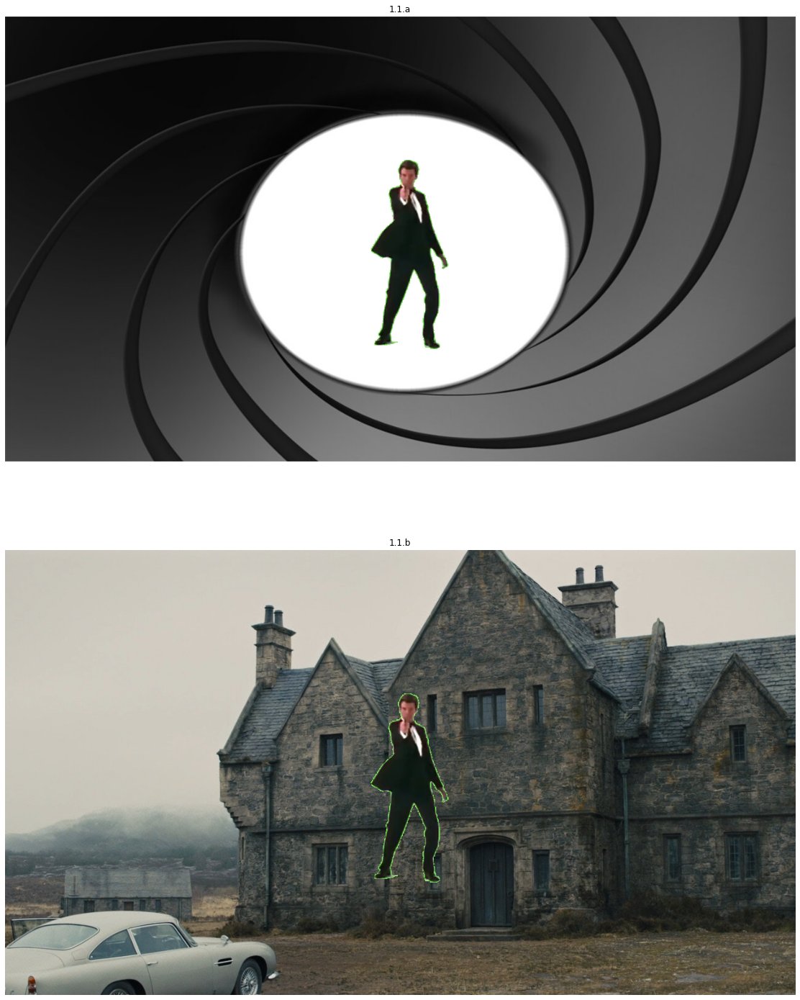

In [17]:
#QUESTION 1
#PART 1.a
fg = cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/fg.jpg") 
bg = cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/bg.jpg") 
lodge=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/Skyfall_Lodge.jpg")
timetostop=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/timetostop.jpg")
frank=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/frank.jpg")
#generate mask cutoffs
upper=np.array([136,255,82])
lower=np.array([36,205,0])

mask=np.copy(fg)
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
mask=cv2.inRange(mask,lower,upper) #this is the mask we will use to do chroma keying

#remove fg background
finalfg=np.copy(fg)
finalfg[mask!=0]=[0,0,0]

#make hole in background
bg1=np.copy(bg)
bg1[mask==0]=[0,0,0]

#apply mask
final=bg1+finalfg

#cv2_imshow(final)
#cv2.imwrite('bond1.jpg',final)
#asdf=px.imshow(final)
#asdf.show()


#PART 1.b
clodge=lodge[0:720,0:1280]
clodge[mask==0]=[0,0,0]
final2=clodge+finalfg

final = cv2.cvtColor(final, cv2.COLOR_BGR2RGB)
final2 = cv2.cvtColor(final2, cv2.COLOR_BGR2RGB)
fig,sub= plt.subplots(2,1,figsize=(25,25))
sub[0].imshow(final)
sub[0].axis('off')
sub[0].set_title("1.1.a")

sub[1].imshow(final2)
sub[1].axis('off')
sub[1].set_title("1.1.b")

[ 21 254  12]


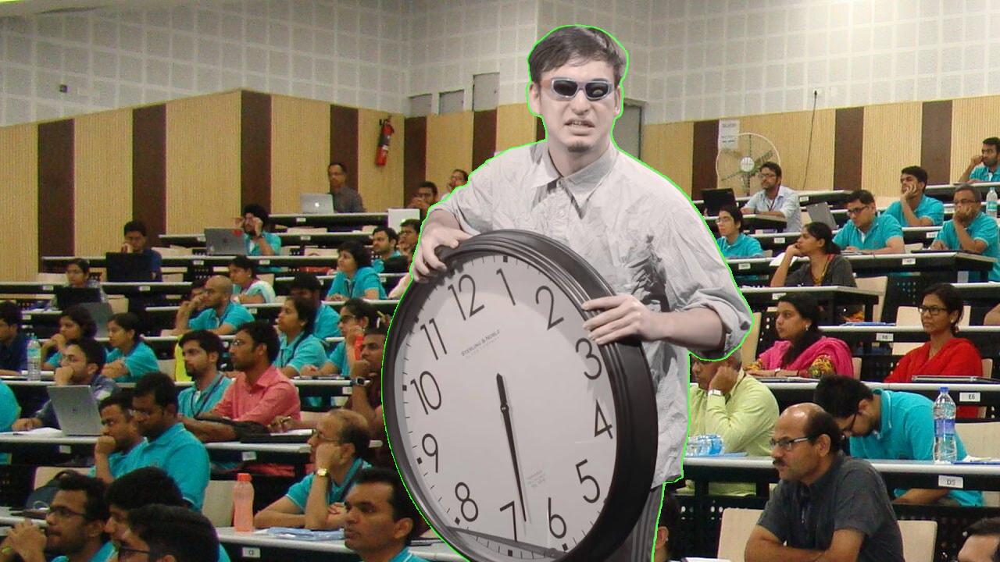

True

In [12]:
#PART 1.c
timetostop=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/timetostop.jpg")
frank=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/hilayacrop.jpg")
upper=np.array([62,255,71])
lower=np.array([0,204,0])

mask=np.copy(timetostop)
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
mask=cv2.inRange(mask,lower,upper) #mask

ftimetostop=np.copy(timetostop)
ftimetostop[mask!=0]=[0,0,0]

face=frank[0:720,0:1280]
face[mask==0]=[0,0,0]

final3=face+ftimetostop
cv2_imshow(final3)
cv2.imwrite('final3.jpg',final3)

**Question 1, part 2:**

Given that the cloud size is of 4 GB and each image size is 1280 x 720,
- Each image pixel has 8 bits, and since the image has 3 channels, the image has 24 pixels for each bit. Total image size: (1280 x 720) x (24 bits) = 22118400 bits.
- 4GB = (4 x 1000 x 1000 x 1000) x 8 bits = 32000000000 bits.
- Total images you can store: 32000000000/22118400 = 1446 images.

<h1>
QUESTION 2
</h1>


Image occupies 168.75 MB:
- Size of pixel of 3 channel RGB image = 3 bytes
- 168.75 MB = 168.75 x (1000 x 1000 bytes) = 168750000 bytes
- Number of pixels = 168750000/(3 per pixel) = 56250000 pixels


$\sqrt[2]{56250000}$ = 7500 

Therefore it is a 7500x7500 dimensional image.

<h1>
QUESTION 3
</h1>


- Since the CCD sensor size is $ 10 * 10 $ mm and has a resolution of $ 1024 * 1024$ pixels
- Height of 50 pixels= $\frac{10*50}{1024}=0.48828125$ mm $=0.048828125$ cm

- Given focal length = $62.5$ mm
- $y = \frac{f*Y}{d}$. Here $y$ is length of image, $f$ is focal length, $Y$ is size of insignia, and $d$ is distance from insignia.
- $\frac{50}{1024} = \frac{6.25 * 32.8} {d}$ 
- Therefore, $d = \frac{6.25 * 32.8 * 1024}{50} = 41948$ cm 

$Therefore,$ $d = 4194.8$ cm


<h1>
QUESTION 4
</h1>
Quantization of images, generating bitplanes, and reverse image corruption

In [ ]:
#QUESTION 4: IMAGE QUANTIZATION
def bitQuantizeImage(im,k):
  x=(im//2**(8-k)).astype(int)
  return (255*x // ((2**k)-1)) 

im=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/007_test1.png")
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

fig, sub = plt.subplots(4,2,figsize=(15,15))
k=1
for i in range(4):
  for j in range(2):
    im1=bitQuantizeImage(im,k)
    sub[i][j].imshow(im1)
    sub[i][j].axis('off')
    sub[i][j].set_title("k="+ str(k))
    k=k+1

In [ ]:
#QUESTION 4 PART2: BITPLANES
im=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/007_test2.png",0)

x, y = plt.subplots(4,2,figsize=(20,20))
k=1
for i in range(4):
  for j in range(2):
    bit=np.mod(im,2**k) #find bit using modulus operation
    y[i][j].imshow(bit, cmap='gray', vmin=0, vmax=255)
    y[i][j].axis('off')
    y[i][j].set_title("k="+ str(k))
    k=k+1

In [ ]:
#QUESTON 4 PART 3: REVERSE CORRUPTION
#2018102008%5=3
#k=3; using m's image

def bitQuantizeImage(im,k):
  x=(im//2**(8-k)).astype(int)
  return (255*x // ((2**k)-1)) 

m=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/m.jpg")
mc=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/m_corrupt.jpg")

mtest=cv2.cvtColor(m, cv2.COLOR_BGR2GRAY)
mtest=bitQuantizeImage(mtest,3) #3 bit quantization
mtest=255*( 1-(mtest/255) ) #invert grayscale image

fig, sub=plt.subplots(3,1,figsize=(20,20))
m=cv2.cvtColor(m, cv2.COLOR_BGR2RGB)
sub[0].imshow(m)
sub[0].axis('off')
sub[0].set_title("Original image")

sub[1].imshow(mc)
sub[1].axis('off')
sub[1].set_title("Original Corrupted image")

sub[2].imshow(mtest,'gray')
sub[2].axis('off')
sub[2].set_title("My Corrupted image")


<h1>
QUESTION 5
</h1>
Linear Contrast Stretching

In [ ]:
#QUESTION 5
def linContrastStretching(im,a,b):
  alow=np.amin(im)
  ahigh=np.amax(im)
  im = im.astype(np.float64)
  im1=((im-alow)*(b-a)*1.0/((ahigh-alow)*1.0))
  im1=np.round(im1)
  im1=im1+a
  return im1.astype(np.uint8)

bad=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/quantum_bad.jpg")
good=linContrastStretching(bad,0,255)
cv2_imshow(good)

#plt.hist(bad.ravel(),256,[0,256])
#plt.show()
#plt.hist(good.ravel(),256,[0,256])
#plt.show()

<h1>
QUESTION 6
</h1>
Histogram Equalization

In [ ]:
#QUESTION 6
def histEqualization(im):
  cdf=np.zeros(256,dtype=int)
  for i in range(256):
    cdf[i]= ((im<=i).sum())
  cdf=cdf*1.0/(im.shape[0]*im.shape[1]*1.0) #normalize image
  im=im.astype(np.uint8) #convert to uint8
  im1=np.copy(im)
  im1 = np.round(255.0 * cdf[im]) #scale back upto 255
  im1=np.round(im1)
  im1=im1.astype(np.uint8)
  return im1

im=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/practice_range1.jpg",0)
im2=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/hist.jpg",0)
im = im.astype(np.float64)
im1=histEqualization(im)
im3=histEqualization(im2)
#cv2_imshow(im1)
#cv2_imshow(im3)

fig, sub=plt.subplots(2,1,figsize=(20,20))
sub[0].imshow(im1,'gray')
sub[0].axis('off')
sub[0].set_title("practice_range1")

sub[1].imshow(im3,'gray')
sub[1].axis('off')
sub[1].set_title("hist")

#cv2.imwrite('equalize.jpg',im1)

Histogram Matching:

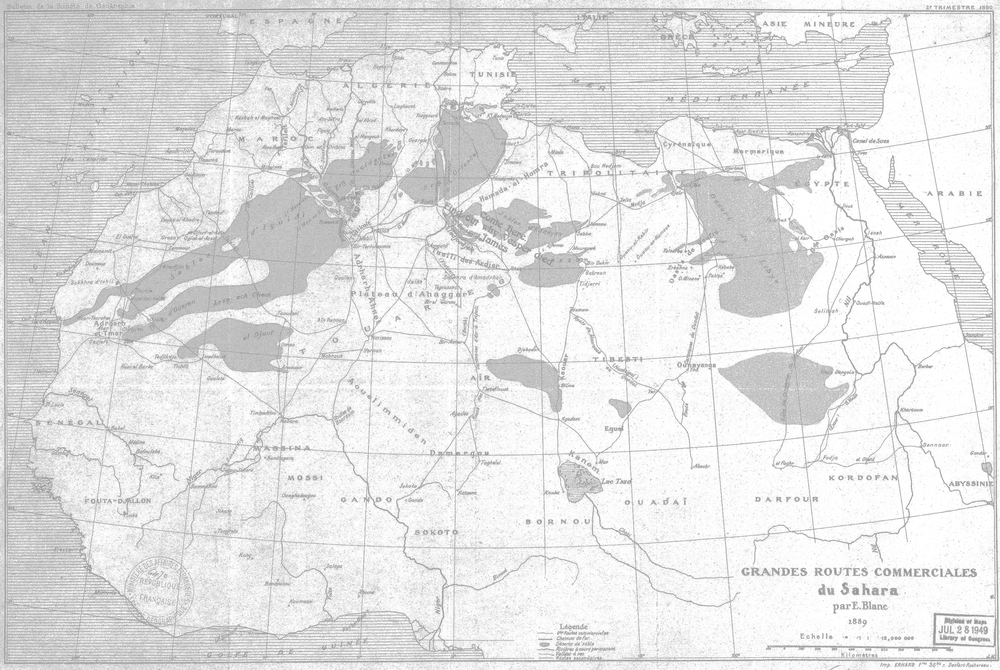

'\nplot1=plt.figure(1)\nplt.hist(map.ravel(),256,[0,256]) \nplot2=plt.figure(2)\nplt.hist(satim.ravel(),256,[0,256]) \nplot3=plt.figure(3)\nplt.hist(matchmap.ravel(),256,[0,256]) \nplt.show()\n'

In [46]:
map=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/Map.jpg",0) #input img
satim=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/satellite_img.jpg",0) #spec img
#cdfmap, cdfsat=histGen(map, satim)



#print(cdfmap,'\n', cdfsat)
#maphist = cv2.calcHist([map],[0],None,[256],[0,256])
#sathist = cv2.calcHist([satim],[0],None,[256],[0,256])

def histMatching(im1,im2):
  cdfsrc=np.zeros(256,dtype=int)
  cdfref=np.zeros(256,dtype=int)
  for i in range(256):
    cdfsrc[i]= ((im1<=i).sum())
    cdfref[i]= ((im2<=i).sum())
  #generating cdf:
  cdfsrc=cdfsrc*1.0/(im1.shape[0]*im1.shape[1]*1.0)#normalize both cdfs
  cdfref=cdfref*1.0/(im2.shape[0]*im2.shape[1]*1.0)
  cdfsrc=np.floor(255*cdfsrc)
  cdfref=np.floor(255*cdfref)
  #a=np.zeros(256)
  lookup=np.zeros(256)
  #actj=0
  for i in range(256):
    #actmin=np.iinfo(np.int).max
    nearest=np.abs(cdfref-cdfsrc[i]) #calculate distance between the two cdfs
    j=np.where(nearest == nearest.min()) #find indexes of all pts where the distance is minimum
    #print(j[0][0])
    j=np.asarray(j) #convert list to numpy array 
    #print(type(j))  
    asdf=np.abs(j-i) #calculate nearest intensity to original minimum intensity
    #print(type(asdf)) 
    finalindex=asdf.argmin() #find nearest intensity
    #print(type(finalindex))
    lookup[i]=j[0][finalindex] #store both the intensities in a lookup table
  matched=cv2.LUT(im1,lookup) #Lookup operation
  return matched

matchmap=histMatching(map,satim)
cv2_imshow(matchmap)
"""
plot1=plt.figure(1)
plt.hist(map.ravel(),256,[0,256]) 
plot2=plt.figure(2)
plt.hist(satim.ravel(),256,[0,256]) 
plot3=plt.figure(3)
plt.hist(matchmap.ravel(),256,[0,256]) 
plt.show()
"""

#cv2.imwrite('matching.jpg',matchmap)

<h1>
QUESTION 7
</h1>
Piecewise Linear Transform Implementation

Text(0.5, 1.0, 'transform used')

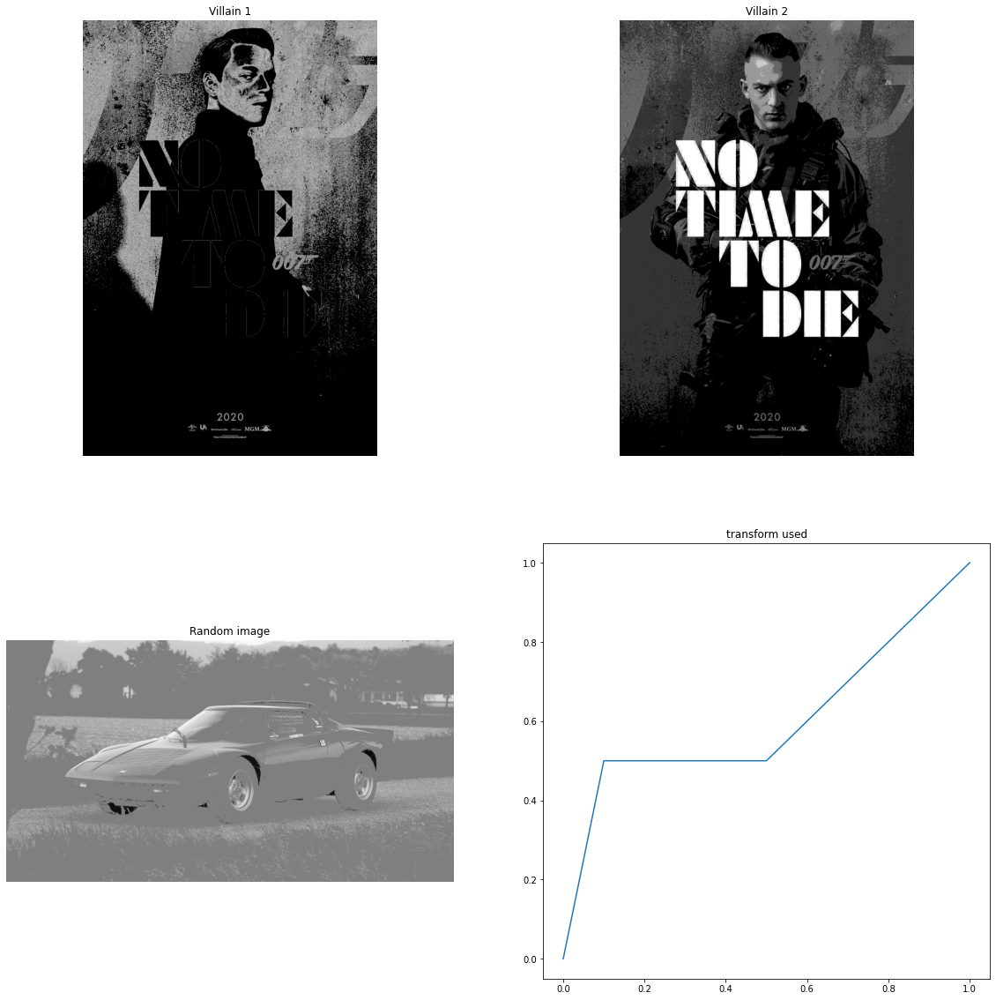

In [50]:
# QUESTION 7
def Transform(im,k1,k2,a,b):
  if (im >= a and im <= b): # >= and <= on both sides 
    im1=k1*im+k2 
  else:
    im1=im #only work on intensities within boundaries
  return im1

bondvillain1=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/bondvillain1.jpg",0)/255
bondvillain2=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/bondvillain2.jpg",0)/255
random=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/9af7c97f-lancia-stratos-stradale-00.jpg",0)/255
#cv2_imshow(random*255)
#image 1
'''
a=[0,0.3,0.6,0.8]
b=[0.3,0.6,0.8,1]
k1=[0,0,0,2.2]
k2=[0,4/3,-2,0]
k1=k1*255
k2=k2*255
'''
piecewiseLinTransform=np.vectorize(Transform)
im1=piecewiseLinTransform(bondvillain1,0,0,0,0.3)
im1=piecewiseLinTransform(im1,4/3,0,0.3,0.6)
im1=piecewiseLinTransform(im1,-2,2,0.6,0.8)
im1=piecewiseLinTransform(im1,0,0,0.8,1)
im1=im1*255
#cv2_imshow(im1*255)

im2=piecewiseLinTransform(bondvillain2,0,0,0,0.2)
im2=piecewiseLinTransform(im2,0,0.2,0.2,0.4)
im2=piecewiseLinTransform(im2,0,0.4,0.4,0.6)
im2=piecewiseLinTransform(im2,0,0.6,0.6,0.8)
im2=piecewiseLinTransform(im2,0,0.8,0.8,254/255)
im2=im2*255
#cv2_imshow(im2*255)

im3=piecewiseLinTransform(random,5,0,0,0.1)
im3=piecewiseLinTransform(im3,0,0.5,0.1,0.5)
im3=piecewiseLinTransform(im3,1,0,0.5,254/255)
im3=im3*255

cv2.imwrite('bond1.jpg',im1*255)
cv2.imwrite('bond2.jpg',im2*255)
cv2.imwrite('random.jpg',im3*255)

fig,sub= plt.subplots(2,2,figsize=(20,20))
sub[0][0].imshow(im1,cmap='gray', vmin=0, vmax=255)
sub[0][0].axis('off')
sub[0][0].set_title("Villain 1")

sub[0][1].imshow(im2, cmap='gray', vmin=0, vmax=255)
sub[0][1].axis('off')
sub[0][1].set_title("Villain 2")

im3=im3.astype(np.uint8)
#im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2RGB)
sub[1][0].imshow(im3,'gray')
sub[1][0].axis('off')
sub[1][0].set_title("Random image")

x=[0,0.1,0.5,1]
y=[0,0.5,0.5,1]
sub[1][1].plot(x, y)
sub[1][1].set_title("transform used")



<h1>
QUESTION 8
</h1>
Gamma Transform Implementation

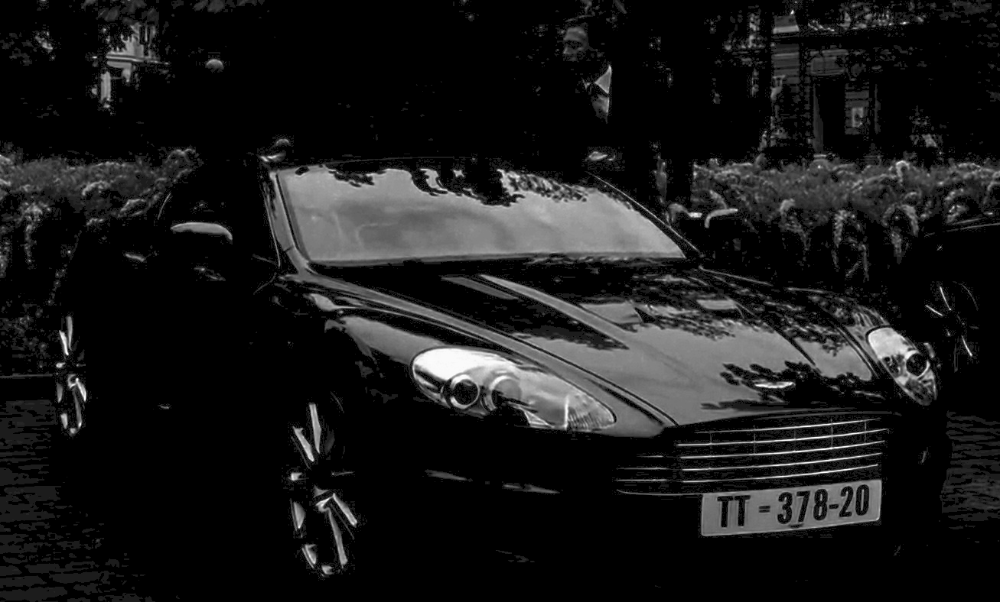

(-0.5, 1306.5, 787.5, -0.5)

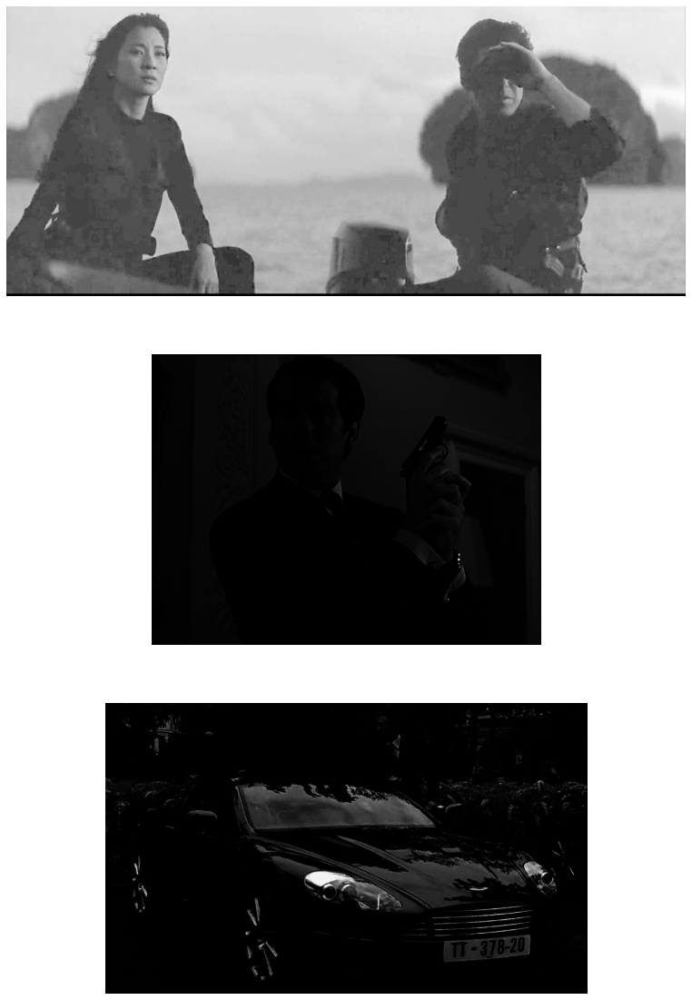

In [57]:
#QUESTION 8
def gammaTransform(im,gamma):
  im1=np.copy(im)
  #im1=im1.astype(np.float64)
  h=im.shape[0]
  w=im.shape[1]
  im1=np.array(255*((im/255)**gamma))
  im1=np.round(im1)
  im1=im1.astype(np.uint8)
  return im1

stealth=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/stealth.png")
stealth = cv2.cvtColor(stealth, cv2.COLOR_BGR2GRAY)
stealthgam=gammaTransform(stealth,0.4)
cv2.imwrite('equalize.jpg',stealthgam)
#cv2_imshow(stealthgam)
#cv2_imshow(stealth)

unstealth=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/unstealth.png")
unstealth = cv2.cvtColor(unstealth, cv2.COLOR_BGR2GRAY)
unstealthgam=gammaTransform(unstealth,3)
#cv2_imshow(unstealthgam)

aston=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/aston_invisible.jpg")
aston = cv2.cvtColor(aston, cv2.COLOR_BGR2GRAY)
visaston=gammaTransform(aston,0.4)
cv2_imshow(visaston)

fig,sub= plt.subplots(3,1,figsize=(20,20))
sub[0].imshow(stealthgam,cmap='gray')
sub[0].axis('off')

sub[1].imshow(unstealthgam, cmap='gray', vmin=0, vmax=255)
sub[1].axis('off')

sub[2].imshow(aston, cmap='gray')
sub[2].axis('off')

<h1>
QUESTION 9
</h1>
Is that the best you got?

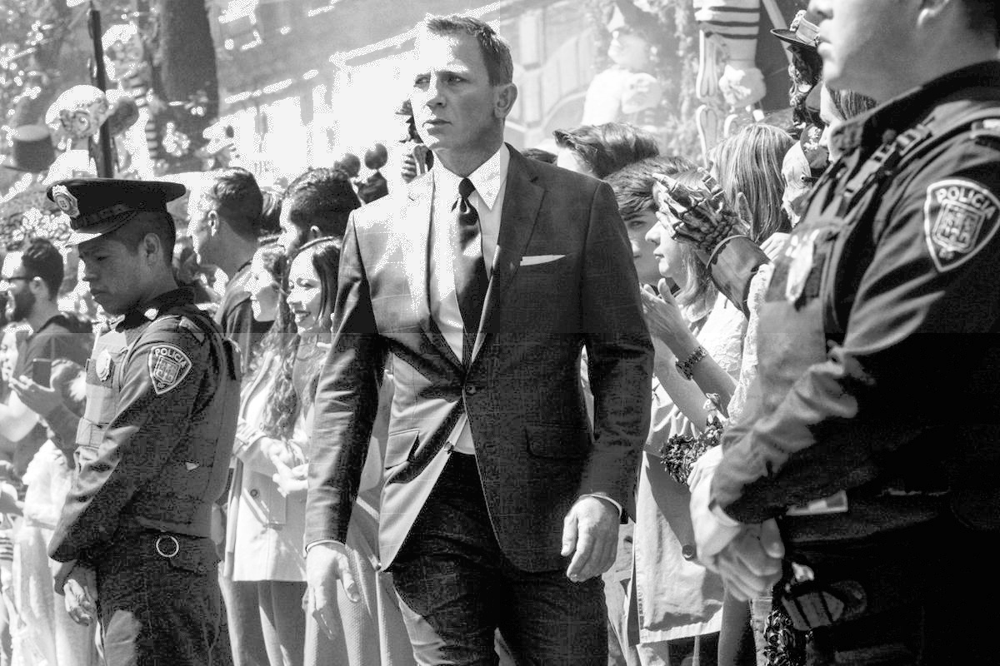

True

In [74]:
#QUESTION 9

def histMatching(im1,im2):
  cdfsrc=np.zeros(256,dtype=int)
  cdfref=np.zeros(256,dtype=int)
  for i in range(256):
    cdfsrc[i]= ((im1<=i).sum())
    cdfref[i]= ((im2<=i).sum())
  #generating cdf:
  cdfsrc=cdfsrc*1.0/(im1.shape[0]*im1.shape[1]*1.0)
  cdfref=cdfref*1.0/(im2.shape[0]*im2.shape[1]*1.0)
  cdfsrc=np.floor(255*cdfsrc)
  cdfref=np.floor(255*cdfref)
  min=0
  a=np.zeros(256)
  lookup=np.zeros(256)
  actj=0
  for i in range(256):
    actmin=np.iinfo(np.int).max
    nearest=np.abs(cdfref-cdfsrc[i])
    j=np.where(nearest == nearest.min())
    #print(j[0][0])
    j=np.asarray(j)
    #print(type(j))
    
    asdf=np.abs(j-i)
    #print(type(asdf))
    finalindex=asdf.argmin()
    #print(type(asdf))
    #print(type(finalindex))
    lookup[i]=j[0][finalindex]
  matched=cv2.LUT(im1,lookup)
  return matched

def gammaTransform(im,gamma):
  im1=np.copy(im)
  #im1=im1.astype(np.float64)
  h=im.shape[0]
  w=im.shape[1]
  im1=np.array(255*((im/255)**gamma))
  im1=np.round(im1)
  im1=im1.astype(np.uint8)
  return im1

def histEqualization(im):
  cdf=np.zeros(256,dtype=int)
  for i in range(256):
    cdf[i]= ((im<=i).sum())
  #generating cdf:
  #cdf=np.cumsum(pdf)
  cdf=cdf*1.0/(im.shape[0]*im.shape[1]*1.0)
  im=im.astype(np.uint8)
  im1=np.copy(im)
  im1 = np.round(255.0 * cdf[im])
  im1=im1.astype(np.uint8)
  return im1

def stitch(im1,im2,im3,im4):
  h1=im1.shape[0]
  h2=im2.shape[0]
  h3=im3.shape[0]
  h4=im4.shape[0]
  w1=im1.shape[1]
  w2=im2.shape[1]
  w3=im3.shape[1]
  w4=im4.shape[1]
  h=h1+h2
  w=w1+w2
  im=np.zeros((h,w))
  for i in range(400):
    for j in range(600):
      im[i,j]=im1[i,j]
  for i in range(400,800):
    for j in range(600):
      im[i,j]=im2[i-400,j]
  for i in range(400):
    for j in range(600,1200):
      im[i,j]=im3[i,j-600]
  for i in range(400,800):
    for j in range(600,1200):
      im[i,j]=im4[i-400,j-600]
  return im


'''
plot1=plt.figure(1)
plt.hist(james1.ravel(),256,[0,256]) 

plot2=plt.figure(2)
plt.hist(james2.ravel(),256,[0,256]) 

plot3=plt.figure(3)
plt.hist(james3.ravel(),256,[0,256]) 

plot4=plt.figure(4)
plt.hist(james4.ravel(),256,[0,256]) 

plt.show()
'''

james1=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james1.jpg",0)
james2=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james2.jpg",0)
james3=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james3.jpg",0)
james4=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/james4.jpg",0)


j1=np.copy(james1)
j2=np.copy(james2)
j3=np.copy(james3)
j4=np.copy(james4)

j1=histEqualization(james1)
#j4=histEqualization(james4)
#j3=histEqualization(james3)

j1=histMatching(j1,james2)
j3=histMatching(j3,james2)
j4=histMatching(j4,james2)

j1=gammaTransform(j1,0.7)
j2=gammaTransform(j2,10)
j3=gammaTransform(j3,1.2)
j4=gammaTransform(j4,3)
#j3=histMatching(j3,j4)

im=stitch(james1,james3,james2,james4)
im1=stitch(j1,j3,james2,j4)
#cv2_imshow(im)
cv2_imshow(im1)
cv2.imwrite('awer.jpg',im)
cv2.imwrite('asdf.jpg',im1)

In [ ]:
#TO TEST HIT MATCHING ALGO

map=cv2.imread("/content/orig.jpg",0) #input img
satim=cv2.imread("/content/reference.jpg",0) #spec img
output=cv2.imread("/content/output.jpg",0) #spec img
#cdfmap, cdfsat=histGen(map, satim)
￼￼￼￼
plot1=plt.figure(1)
plt.hist(map.ravel(),256,[0,256]) 
plot2=plt.figure(2)
plt.hist(satim.ravel(),256,[0,256]) 

#print(cdfmap,'\n', cdfsat)
#maphist = cv2.calcHist([map],[0],None,[256],[0,256])
#sathist = cv2.calcHist([satim],[0],None,[256],[0,256])

def histMatching(im1,im2):
  cdfsrc=np.zeros(256,dtype=int)
  cdfref=np.zeros(256,dtype=int)
  for i in range(256):
    cdfsrc[i]= ((im1<=i).sum())
    cdfref[i]= ((im2<=i).sum())
  #generating cdf:
  cdfsrc=cdfsrc*1.0/(im1.shape[0]*im1.shape[1]*1.0)
  cdfref=cdfref*1.0/(im2.shape[0]*im2.shape[1]*1.0)
  cdfsrc=np.floor(255*cdfsrc)
  cdfref=np.floor(255*cdfref)
  min=0
  a=np.zeros(256)
  lookup=np.zeros(256)
  actj=0
  for i in range(256):
    actmin=np.iinfo(np.int).max
    nearest=np.abs(cdfref-cdfsrc[i])
    j=np.where(nearest == nearest.min())
    #print(j[0][0])
    j=np.asarray(j)
    #print(type(j))
    
    asdf=np.abs(j-i)
    #print(type(asdf))
    finalindex=asdf.argmin()
    #print(type(finalindex))
    lookup[i]=j[0][finalindex]
  matched=cv2.LUT(im1,lookup)
  return matched

matchmap=histMatching(map,satim)
plot3=plt.figure(3)
plt.hist(matchmap.ravel(),256,[0,256]) 
plot4=plt.figure(4)
plt.hist((matchmap-output).ravel(),256,[0,256]) 
plt.show()

#cv2.imwrite('matching.jpg',matchmap)

AttributeError: ignored

<Figure size 432x288 with 0 Axes>

In [ ]:
def histGen(im1,im2):
  cdf1=np.zeros(256,dtype=int)
  cdf2=np.zeros(256,dtype=int)
  for i in range(256):
    cdf1[i]= ((im1<=i).sum())
    cdf2[i]= ((im2<=i).sum())
  #generating cdf:
  cdf1=cdf1*1.0/(im1.shape[0]*im1.shape[1]*1.0)
  cdf2=cdf2*1.0/(im2.shape[0]*im2.shape[1]*1.0)
  cdf1=np.floor(255*cdf1)
  cdf2=np.floor(255*cdf2)
  return cdf1, cdf2

map=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/Map.jpg",0) #input img
satim=cv2.imread("/content/drive/My Drive/IIITH Assignments 3-1/DIP/dip1/satellite_img.jpg",0) #spec img
cdfmap, cdfsat=histGen(map, satim)
plot1=plt.figure(1)
plt.hist(map.ravel(),256,[0,256]) 
plot2=plt.figure(2)
plt.hist(satim.ravel(),256,[0,256]) 
#print(cdfmap,'\n', cdfsat)
#maphist = cv2.calcHist([map],[0],None,[256],[0,256])
#sathist = cv2.calcHist([satim],[0],None,[256],[0,256])


def histMatching(cdfsrc,cdfref):
  min=0
  a=np.zeros(256)
  lookup=np.zeros(256)
  actj=0
  for i in range(256):
    actmin=np.iinfo(np.int).max
    nearest=np.abs(cdfref-cdfsrc[i])
    j=nearest.argmin()
    lookup[i]=j
  #print(lookup)
  return lookup

lookup=histMatching(cdfmap,cdfsat)
matchmap=np.copy(map)
matchmap=cv2.LUT(map,lookup)
plot3=plt.figure(3)
plt.hist(matchmap.ravel(),256,[0,256]) 
plt.show()
cv2_imshow(matchmap)
cv2.imwrite('matching.jpg',matchmap)